In [1]:
import anndata as ad
import scanpy as sc
sc_file="D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\scRNA_commmon_genes.h5ad"
adata1 = ad.read_h5ad(sc_file)
adata=adata1.copy()
adata


AnnData object with n_obs × n_vars = 35212 × 20091
    obs: 'x', 'group', 'condition', 'celltype'
    var: 'x'
    uns: 'log1p'

In [14]:
adata.obs['celltype'].unique()

['Ex_10_L2_4', 'Inhib_5', 'Ex_8_L5_6', 'Inhib_2_VIP', 'Mix_2', ..., 'Oligos_1', 'Ex_9_L5_6', 'Ex_4_L_6', 'Astros_1', 'Inhib_4_SST']
Length: 33
Categories (33, object): ['Astros_1', 'Astros_2', 'Astros_3', 'Endo', ..., 'OPCs_2', 'Oligos_1', 'Oligos_2', 'Oligos_3']

D:\Anaconda3\envs\MACD\lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\tools\_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider join

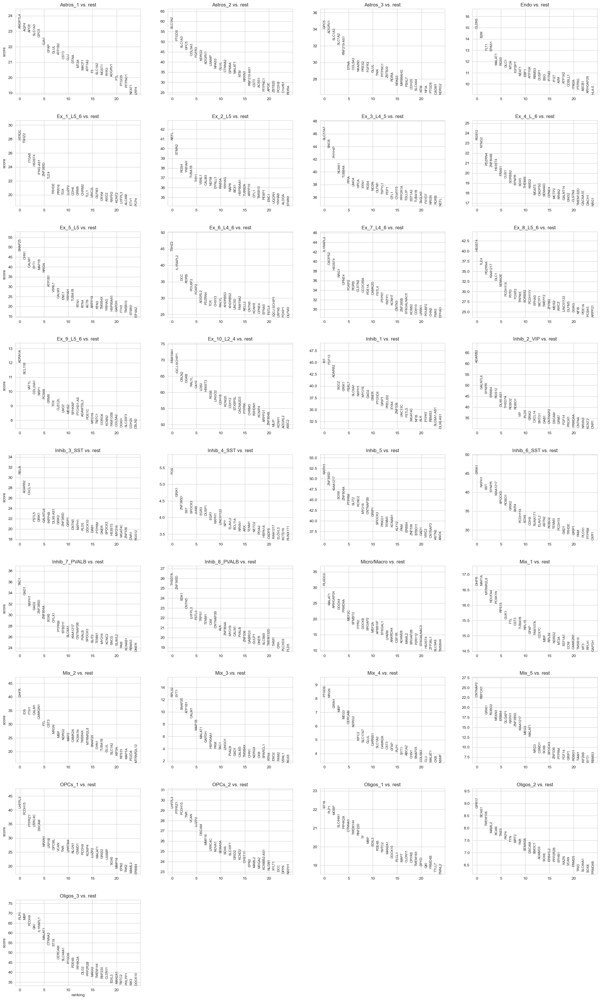

Cell type: Astros_1, Top 10 marker genes: ['ANGPTL4' 'AQP4' 'APOE' 'SLC1A3' 'GPC5' 'GJA1' 'GFAP' 'GLUL' 'ATP1B2'
 'CST3']
Cell type: Astros_2, Top 10 marker genes: ['SLC1A2' 'PTGDS' 'SLC1A3' 'GPC5' 'COL5A3' 'FGFR3' 'NDRG2' 'ADGRV1'
 'LSAMP' 'NPAS3']
Cell type: Astros_3, Top 10 marker genes: ['GPC5' 'ADGRV1' 'SLC1A3' 'SLC1A2' 'RNF219-AS1' 'DTNA' 'COL5A3' 'NKAIN3'
 'PREX2' 'FGFR3']
Cell type: Endo, Top 10 marker genes: ['CLDN5' 'B2M' 'FLT1' 'EPAS1' 'MALAT1' 'RGS5' 'DLC1' 'MT2A' 'IGFBP7'
 'NEAT1']
Cell type: Ex_1_L5_6, Top 10 marker genes: ['HTR2C' 'TSHZ2' 'ITGA8' 'HS3ST4' 'IFNG-AS1' 'ZNF385D' 'TLE4' 'TRHDE'
 'PRR16' 'TOX']
Cell type: Ex_2_L5, Top 10 marker genes: ['NEFL' 'STMN2' 'RGS4' 'YWHAH' 'TUBA1B' 'THY1' 'VSNL1' 'CALM3' 'NEFM'
 'DYNLL1']
Cell type: Ex_3_L4_5, Top 10 marker genes: ['SLC17A7' 'SNCB' 'PHYHIP' 'NUAK1' 'TUBB4A' 'PPIA' 'LMO4' 'HPCA' 'SYN1'
 'RGS4']
Cell type: Ex_4_L_6, Top 10 marker genes: ['RGS12' 'NTNG2' 'PDZRN4' 'ZNF804B' 'HS3ST4' 'FRAS1' 'CUX1' 'SORBS2'
 'SYNPR' 'SOX5

In [3]:
# print(adata.obs['celltype_new'])
sc.pp.normalize_total(adata, target_sum=1e4) # 不要和log顺序搞反了 ，这个是去文库的
sc.pp.log1p(adata)
sc.tl.rank_genes_groups(adata, 'celltype', method='wilcoxon')
# 绘制差异表达基因结果
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
top_genes = {group: result['names'][group][:10] for group in groups}

for group, genes in top_genes.items():
    print(f"Cell type: {group}, Top 10 marker genes: {genes}")

In [4]:
import anndata as ad
from matplotlib import pyplot as plt
import numpy as np
st_file ="D:\pythonplaces\deconv-mulST\Dataset_origin\Dataset1-DLPFC\Spatial_ST1.h5ad"
stadata = ad.read_h5ad(st_file)
stadata
# 选择感兴趣的基因

D:\Anaconda3\envs\MACD\lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3611 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'batch_name', 'barcode', 'slice_id', 'layer'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [50]:
resultdata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce/full\pre_labels.h5ad')
resultdata

AnnData object with n_obs × n_vars = 34241 × 3281
    obs: 'batch_name_new', 'Istrue', 'domain'
    uns: 'deconv_result', 'latent_no_batch', 'pca', 'x_recon_1', 'x_recon_2', 'x_recon_3', 'x_recon_4'
    obsm: 'X_pca', 'dist_adj', 'exp_adj', 'latent'
    varm: 'PCs'

In [9]:
df=resultdata.uns['deconv_result']
df

,Ex_10_L2_4,Ex_3_L4_5,Oligos_3,Astros_2,Inhib_2_VIP,Ex_5_L5,Ex_7_L4_6,Inhib_5,Mix_5,Inhib_6_SST,...,Inhib_8_PVALB,Mix_4,Astros_1,Oligos_1,Endo,Mix_3,Mix_1,Ex_9_L5_6,Oligos_2,Inhib_4_SST
AAACAAGTATCTCCCA-1_1,0.062634,0.047115,0.007134,0.034271,0.087461,0.096043,0.008294,0.015579,0.011918,0.092464,...,0.014648,0.018336,0.009465,0.003090,0.000873,0.023486,0.051781,0.007478,0.010138,0.010498
AAACAATCTACTAGCA-1_1,0.017039,0.002911,0.066674,0.043680,0.350923,0.009105,0.009720,0.110352,0.107417,0.012053,...,0.008315,0.010343,0.001406,0.012705,0.032034,0.010276,0.004473,0.007924,0.012164,0.024930
AAACACCAATAACTGC-1_1,0.000387,0.001009,0.134276,0.003046,0.005640,0.002931,0.013500,0.014217,0.004854,0.009614,...,0.012620,0.004766,0.005285,0.542548,0.092069,0.004181,0.006662,0.005557,0.008263,0.004888
AAACAGAGCGACTCCT-1_1,0.090002,0.069075,0.007250,0.017052,0.128866,0.048880,0.007597,0.014181,0.012460,0.197710,...,0.004998,0.015255,0.005418,0.002359,0.000892,0.014949,0.013535,0.007045,0.014228,0.011225
AAACAGCTTTCAGAAG-1_1,0.754452,0.064249,0.114214,0.002003,0.001426,0.004736,0.000442,0.001391,0.000956,0.000275,...,0.001150,0.005143,0.001430,0.000547,0.000478,0.002556,0.001551,0.002155,0.000572,0.000770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1_4,0.436297,0.289711,0.037321,0.003567,0.007663,0.018975,0.001900,0.006960,0.001468,0.001594,...,0.001899,0.010075,0.001598,0.001682,0.001121,0.004575,0.001914,0.003479,0.002338,0.002099
TTGTTTCACATCCAGG-1_4,0.000646,0.002757,0.812868,0.003195,0.000947,0.000963,0.003721,0.003973,0.004289,0.005477,...,0.000649,0.001159,0.000514,0.113806,0.000411,0.000596,0.003905,0.001067,0.001472,0.001430
TTGTTTCATTAGTCTA-1_4,0.000427,0.000795,0.043447,0.004717,0.002998,0.006069,0.020138,0.029841,0.004755,0.014802,...,0.046257,0.004266,0.002589,0.571166,0.066814,0.003605,0.004522,0.007105,0.008754,0.008812
TTGTTTCCATACAACT-1_4,0.056938,0.001856,0.865310,0.004646,0.001712,0.001420,0.001938,0.004316,0.008962,0.000793,...,0.000701,0.003747,0.001064,0.003376,0.003966,0.001992,0.003232,0.002831,0.001272,0.000816


In [10]:
filtered_df = df[df.index.str.endswith("_1")]
filtered_df

,Ex_10_L2_4,Ex_3_L4_5,Oligos_3,Astros_2,Inhib_2_VIP,Ex_5_L5,Ex_7_L4_6,Inhib_5,Mix_5,Inhib_6_SST,...,Inhib_8_PVALB,Mix_4,Astros_1,Oligos_1,Endo,Mix_3,Mix_1,Ex_9_L5_6,Oligos_2,Inhib_4_SST
AAACAAGTATCTCCCA-1_1,0.062634,0.047115,0.007134,0.034271,0.087461,0.096043,0.008294,0.015579,0.011918,0.092464,...,0.014648,0.018336,0.009465,0.003090,0.000873,0.023486,0.051781,0.007478,0.010138,0.010498
AAACAATCTACTAGCA-1_1,0.017039,0.002911,0.066674,0.043680,0.350923,0.009105,0.009720,0.110352,0.107417,0.012053,...,0.008315,0.010343,0.001406,0.012705,0.032034,0.010276,0.004473,0.007924,0.012164,0.024930
AAACACCAATAACTGC-1_1,0.000387,0.001009,0.134276,0.003046,0.005640,0.002931,0.013500,0.014217,0.004854,0.009614,...,0.012620,0.004766,0.005285,0.542548,0.092069,0.004181,0.006662,0.005557,0.008263,0.004888
AAACAGAGCGACTCCT-1_1,0.090002,0.069075,0.007250,0.017052,0.128866,0.048880,0.007597,0.014181,0.012460,0.197710,...,0.004998,0.015255,0.005418,0.002359,0.000892,0.014949,0.013535,0.007045,0.014228,0.011225
AAACAGCTTTCAGAAG-1_1,0.754452,0.064249,0.114214,0.002003,0.001426,0.004736,0.000442,0.001391,0.000956,0.000275,...,0.001150,0.005143,0.001430,0.000547,0.000478,0.002556,0.001551,0.002155,0.000572,0.000770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1_1,0.000525,0.002501,0.570562,0.010227,0.002005,0.001758,0.002879,0.002309,0.003663,0.007253,...,0.000781,0.002048,0.004596,0.156449,0.000631,0.001462,0.006708,0.001640,0.007658,0.001733
TTGTTTCATTAGTCTA-1_1,0.000141,0.000713,0.017035,0.002059,0.002187,0.004882,0.004867,0.004604,0.001484,0.011045,...,0.026305,0.002155,0.009473,0.759642,0.012785,0.001687,0.006049,0.002598,0.005925,0.004883
TTGTTTCCATACAACT-1_1,0.016891,0.002552,0.904957,0.003668,0.001081,0.000962,0.000964,0.002780,0.002704,0.001046,...,0.001239,0.002410,0.001585,0.012615,0.001940,0.001405,0.003796,0.001805,0.002690,0.000600
TTGTTTGTATTACACG-1_1,0.000956,0.001078,0.225918,0.010300,0.005850,0.007416,0.034803,0.033157,0.009306,0.018733,...,0.056137,0.005403,0.002021,0.286695,0.031926,0.005217,0.004579,0.008211,0.009921,0.006470


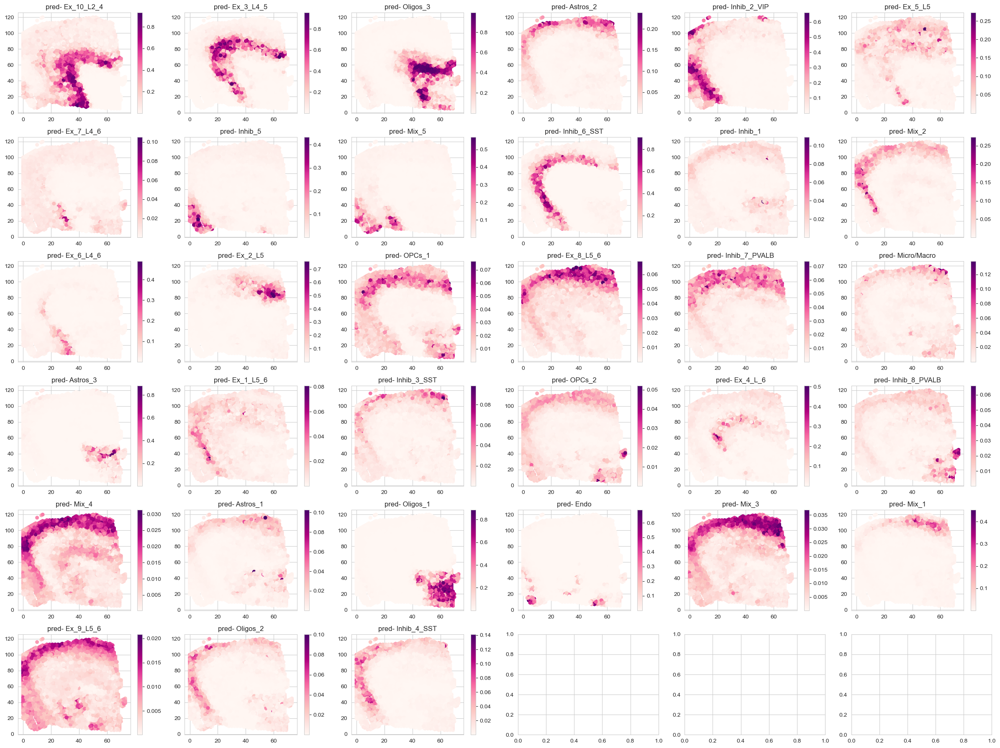

In [22]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the stdata (AnnData object)
st_file = "D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\st1.h5ad"
stadata = sc.read_h5ad(st_file)

result_df = filtered_df
celltype =result_df.columns
# Get the spatial coordinates
x_coordinates = np.array(stadata.obs['array_row'])
y_coordinates = np.array(stadata.obs['array_col'])

fig, axes = plt.subplots(6, 6, figsize=(24, 18))

axes = axes.flatten()
for i, cell_type in enumerate(celltype):
        # Get gene expression data from stadata
        gene_expression = result_df[cell_type].values
        ax_gene = axes[i]  # Use the next available axis
        scatter_gene = ax_gene.scatter(x_coordinates, y_coordinates, c=gene_expression, cmap='RdPu', s=30)
        ax_gene.set_title(f"pred- {cell_type}")  # Set title with gene name
        fig.colorbar(scatter_gene, ax=ax_gene, orientation='vertical')
plt.tight_layout()
plt.show()


In [36]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the stdata (AnnData object)
st_file = "D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\st1.h5ad"
stadata = sc.read_h5ad(st_file)
resultdata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\stage3_only_pre\stage3_only_pre\pre_labels.h5ad')
df=resultdata.uns['deconv_result']
filtered_df = df[df.index.str.endswith("_1")]
result_df = filtered_df
celltype =result_df.columns
# Get the spatial coordinates
x_coordinates = np.array(stadata.obs['array_row'])
y_coordinates = np.array(stadata.obs['array_col'])

fig, axes = plt.subplots(6, 6, figsize=(24, 18))

axes = axes.flatten()
for i, cell_type in enumerate(celltype):
        # Get gene expression data from stadata
        gene_expression = result_df[cell_type].values
        ax_gene = axes[i]  # Use the next available axis
        scatter_gene = ax_gene.scatter(x_coordinates, y_coordinates, c=gene_expression, cmap='RdPu', s=30)
        ax_gene.set_title(f"pred- {cell_type}")  # Set title with gene name
        fig.colorbar(scatter_gene, ax=ax_gene, orientation='vertical')
plt.tight_layout()
plt.show()

Own model AUC: 0.946
Own model AUC_Epoch30: 0.922


In [31]:
from sklearn.metrics import roc_auc_score
import pandas as pd

# ground truth
stadata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\st3.h5ad')
true_labels = stadata.obs['layer'].isin(['L5', 'L4']).astype(int)

# 你自己的模型结果
resultdata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce/full\pre_labels.h5ad')
df=resultdata.uns['deconv_result']
result_df= df[df.index.str.endswith("_3")]
estimated_proportions_own = result_df['Ex_3_L4_5'].values
auc_score = roc_auc_score(true_labels, estimated_proportions_own)
print(f'Own model AUC: {auc_score:.3f}')

# resultdata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Full1\pre_labels.h5ad')
# df=resultdata.uns['deconv_result']
# result_df= df[df.index.str.endswith("_3")]
# estimated_proportions_own = result_df['Ex_3_L4_5'].values
# auc_score = roc_auc_score(true_labels, estimated_proportions_own)
# print(f'Own model AUC_Epoch30: {auc_score:.3f}')

# Cell2location
# cell2locationresult = pd.read_csv(r'D:\pythonplaces\deconv-mulST\Baseline\Cell2location\Result\Cell2location_result2.csv', index_col=0)
# cell2locationresult_filter = cell2locationresult[cell2locationresult.index.str.endswith("_4")]
# estimated_proportions_cell = cell2locationresult_filter['Ex_3_L4_5'].values
# auc_score = roc_auc_score(true_labels, estimated_proportions_cell)
# print(f'Cell2location AUC: {auc_score:.3f}')
# 
# # Spoint
# spointresult = pd.read_csv(r'D:\pythonplaces\deconv-mulST\Baseline\Spoint\Result\proportion.csv', index_col=0)
# spointresult_filter = spointresult[spointresult.index.str.endswith("_4")]
# estimated_proportions_spoint = spointresult_filter['Ex_3_L4_5'].values
# auc_score = roc_auc_score(true_labels, estimated_proportions_spoint)
# print(f'Spoint AUC: {auc_score:.3f}')
# 
# # Stereoscope
# Stereresult = pd.read_csv(r'D:\pythonplaces\deconv-mulST\Baseline\Stereoscope\Result\Stereoscope_result.csv', index_col=0)
# Stereresult_filter = Stereresult[Stereresult.index.str.endswith("_4")]
# estimated_proportions_stereo = Stereresult_filter['Ex_3_L4_5'].values
# auc_score = roc_auc_score(true_labels, estimated_proportions_stereo)
# print(f'Stereoscope AUC: {auc_score:.3f}')
# 
# # Tangram
# Trangramresult = pd.read_csv(r'D:\pythonplaces\deconv-mulST\Baseline\Tangram\Result\Tangram_result.csv', index_col=0)
# Trangramresult_filter = Trangramresult[Trangramresult.index.str.endswith("_4")]
# estimated_proportions_tangram = Trangramresult_filter['Ex_3_L4_5'].values
# auc_score = roc_auc_score(true_labels, estimated_proportions_tangram)
# print(f'Tangram AUC: {auc_score:.3f}')
# 
# 
# resultdata_only=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\stage3_only_pre\stage3_only_pre\pre_labels.h5ad')
# df_only=resultdata_only.uns['deconv_result']
# filtered_df_only = df_only[df_only.index.str.endswith("_4")]
# estimated_proportions_only = filtered_df_only['Ex_3_L4_5'].values
# auc_score = roc_auc_score(true_labels, estimated_proportions_only)
# print(f'Own model_only AUC: {auc_score:.3f}')
# 
# resultdata1=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1/2to2-silce-2\pre_labels.h5ad')
# df1=resultdata1.uns['deconv_result']
# filtered_df1= df1[df1.index.str.endswith("_2")]
# estimated_proportions1 = filtered_df1['Ex_3_L4_5'].values
# auc_score = roc_auc_score(true_labels, estimated_proportions1)
# print(f'Own model1 AUC: {auc_score:.3f}')

Own model AUC: 0.778
Own model AUC_Epoch30: 0.874


In [71]:
alldata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce/full\pre_labels.h5ad')
alldata.obsm['latent_no_batch']=alldata.uns['latent_no_batch']

array([[0.        , 0.        , 0.        , ..., 0.6611893 , 0.38485676,
        0.        ],
       [0.03547895, 0.07506992, 0.        , ..., 0.40428054, 0.38844508,
        0.        ],
       [0.40771294, 0.80579   , 0.9223987 , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.06038612, 0.        ,
        2.6145241 ],
       [0.09307275, 0.        , 0.        , ..., 0.4284216 , 0.26238903,
        1.8954006 ],
       [1.5765039 , 0.55108213, 0.        , ..., 0.        , 0.590729  ,
        0.791577  ]], dtype=float32)

In [73]:
sub_adata_tmp = alldata[alldata.obs['batch_name_new'] != 0]

C:\Users\DELL\AppData\Local\Temp\ipykernel_18976\1386993994.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added_pred] = cluster_labels
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be chan

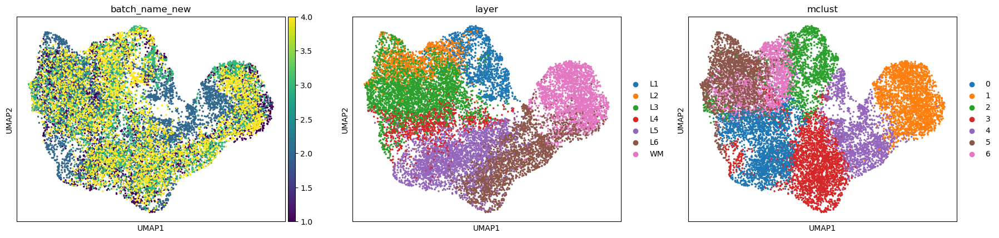

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.sparse as sp
from sklearn.cluster import KMeans

from sklearn.metrics import adjusted_rand_score
alldata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce/full\pre_labels.h5ad')
alldata.obsm['latent_no_batch']=alldata.uns['latent_no_batch']
sub_adata_tmp = alldata[alldata.obs['batch_name_new'] != 0]
def Kmeans_cluster(adata, num_cluster, used='latent', key_added_pred="G3STNET", random_seed=2024):
    np.random.seed(random_seed)
    cluster_model = KMeans(n_clusters=num_cluster, init='k-means++', n_init=100, max_iter=1000, tol=1e-6)
    cluster_labels = cluster_model.fit_predict(adata.obsm[used])
    adata.obs[key_added_pred] = cluster_labels
    adata.obs[key_added_pred] = adata.obs[key_added_pred].astype('int')
    adata.obs[key_added_pred] = adata.obs[key_added_pred].astype('category')
    return adata
adata_clu = Kmeans_cluster(sub_adata_tmp, num_cluster=7, used='latent_no_batch', key_added_pred='mclust', random_seed=42)

data_true=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Real_STdata_filter.h5ad')
import scanpy as sc
adata_clu.obsm['spatial']=data_true.obsm['spatial']
adata_clu.obs['layer']=data_true.obs['layer']
sc.pp.neighbors(adata_clu, use_rep='latent_no_batch', metric='cosine')
sc.tl.umap(adata_clu)
sc.pl.umap(adata_clu, color=['batch_name_new','layer','mclust'], show=True, size=25, save=False)
# 定义映射字典




In [13]:
maps = {
    0: 'L1',
    1: 'L2',
    2: 'L3',
    3: 'L4',
    4: 'L5',
    5: 'L6',
    6: 'WM'
}

# 把 mclust 数字映射成 layer 名称
mclust_mapped = adata_clu.obs['mclust'].map(maps)
# 计算 ARI，两个 Series 都是字符串类型（L1~WM）
ari_score = adjusted_rand_score(adata_clu.obs['layer'], mclust_mapped)
print(f"total ARI: {ari_score:.4f}")
proj_list = [1,2,3,4]
for name in proj_list:
    sub_adata = adata_clu[adata_clu.obs['batch_name_new'] == name]  # 每次从原始数据筛
    mapped = sub_adata.obs['mclust'].map(maps)
    ARI = adjusted_rand_score(sub_adata.obs['layer'], mapped)
    print(f"{name} ARI: {ARI:.4f}")

total ARI: 0.4076
1 ARI: 0.4344
2 ARI: 0.3904
3 ARI: 0.4728
4 ARI: 0.3899


C:\Users\DELL\AppData\Local\Temp\ipykernel_18976\1386993994.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added_pred] = cluster_labels
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be chan

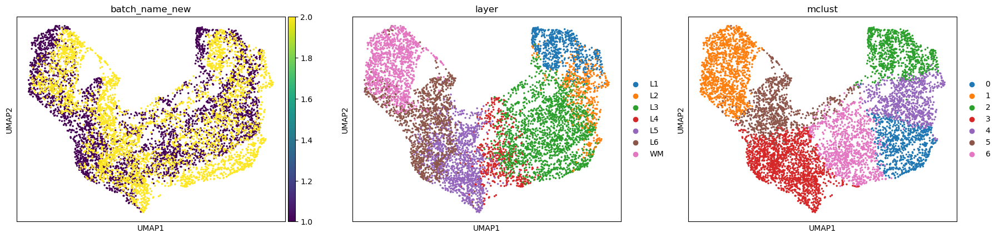

total ARI: 0.4660
1 ARI: 0.4225
2 ARI: 0.5328


In [14]:
alldata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1/2to2-silce-1\pre_labels.h5ad')
alldata.obsm['latent_no_batch']=alldata.uns['latent_no_batch']
sub_adata_tmp = alldata[alldata.obs['batch_name_new'] != 0]
adata_clu = Kmeans_cluster(sub_adata_tmp, num_cluster=7, used='latent_no_batch', key_added_pred='mclust', random_seed=42)

data_true=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1/2to2-silce-1\Real_STdata_filter.h5ad')
import scanpy as sc
adata_clu.obsm['spatial']=data_true.obsm['spatial']
adata_clu.obs['layer']=data_true.obs['layer']
sc.pp.neighbors(adata_clu, use_rep='latent_no_batch', metric='cosine')
sc.tl.umap(adata_clu)
sc.pl.umap(adata_clu, color=['batch_name_new','layer','mclust'], show=True, size=25, save=False)
maps = {
    0: 'L3',
    1: 'L2',
    2: 'L4',
    3: 'WM',
    4: 'L5',
    5: 'L6',
    6: 'L1'
}
# 把 mclust 数字映射成 layer 名称
mclust_mapped = adata_clu.obs['mclust'].map(maps)
# 计算 ARI，两个 Series 都是字符串类型（L1~WM）
ari_score = adjusted_rand_score(adata_clu.obs['layer'], mclust_mapped)
print(f"total ARI: {ari_score:.4f}")
proj_list = [1,2]
for name in proj_list:
    sub_adata = adata_clu[adata_clu.obs['batch_name_new'] == name]  # 每次从原始数据筛
    mapped = sub_adata.obs['mclust'].map(maps)
    ARI = adjusted_rand_score(sub_adata.obs['layer'], mapped)
    print(f"{name} ARI: {ARI:.4f}")

C:\Users\DELL\AppData\Local\Temp\ipykernel_18976\1386993994.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added_pred] = cluster_labels
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be chan

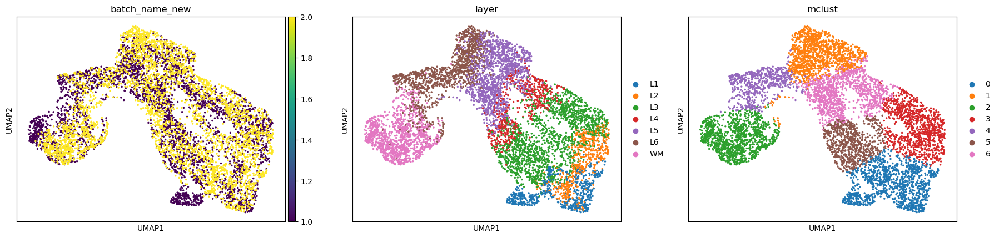

In [15]:
alldata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1/2to2-silce-2\pre_labels.h5ad')
alldata.obsm['latent_no_batch']=alldata.uns['latent_no_batch']
sub_adata_tmp = alldata[alldata.obs['batch_name_new'] != 0]
adata_clu = Kmeans_cluster(sub_adata_tmp, num_cluster=7, used='latent_no_batch', key_added_pred='mclust', random_seed=42)

data_true=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1/2to2-silce-2\Real_STdata_filter.h5ad')
import scanpy as sc
adata_clu.obsm['spatial']=data_true.obsm['spatial']
adata_clu.obs['layer']=data_true.obs['layer']
sc.pp.neighbors(adata_clu, use_rep='latent_no_batch', metric='cosine')
sc.tl.umap(adata_clu)
sc.pl.umap(adata_clu, color=['batch_name_new','layer','mclust'], show=True, size=25, save=False)
maps = {
    0: 'L1',
    1: 'L5',
    2: 'WM',
    3: 'L2',
    4: 'L6',
    5: 'L3',
    6: 'L4'
}
# 把 mclust 数字映射成 layer 名称
mclust_mapped = adata_clu.obs['mclust'].map(maps)
# 计算 ARI，两个 Series 都是字符串类型（L1~WM）
ari_score = adjusted_rand_score(adata_clu.obs['layer'], mclust_mapped)
print(f"total ARI: {ari_score:.4f}")
proj_list = [1,2]
for name in proj_list:
    sub_adata = adata_clu[adata_clu.obs['batch_name_new'] == name]  # 每次从原始数据筛
    mapped = sub_adata.obs['mclust'].map(maps)
    ARI = adjusted_rand_score(sub_adata.obs['layer'], mapped)
    print(f"{name} ARI: {ARI:.4f}")

total ARI: 0.4514
1 ARI: 0.4671
2 ARI: 0.4414


C:\Users\DELL\AppData\Local\Temp\ipykernel_18976\3174390850.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added_pred] = cluster_labels
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be chang

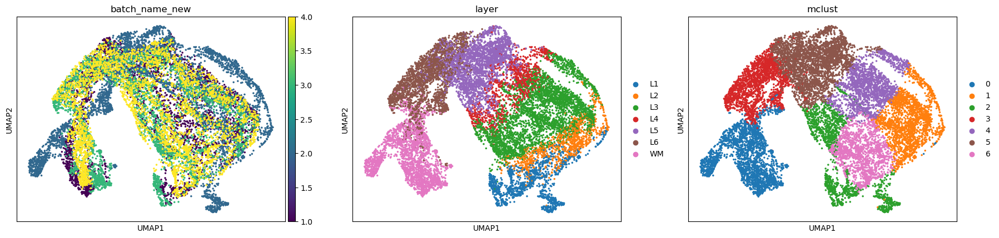

total ARI: 0.4958
1 ARI: 0.4734
2 ARI: 0.5270
3 ARI: 0.5011
4 ARI: 0.5283


In [17]:
import anndata as ad
alldata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Full1\pre_labels.h5ad')
sub_adata_tmp = alldata[alldata.obs['batch_name_new'] != 0]
from sklearn.cluster import KMeans
def Kmeans_cluster(adata, num_cluster, used='latent', key_added_pred="G3STNET", random_seed=2024):
    np.random.seed(random_seed)
    cluster_model = KMeans(n_clusters=num_cluster, init='k-means++', n_init=100, max_iter=1000, tol=1e-6)
    cluster_labels = cluster_model.fit_predict(adata.obsm[used])
    adata.obs[key_added_pred] = cluster_labels
    adata.obs[key_added_pred] = adata.obs[key_added_pred].astype('int')
    adata.obs[key_added_pred] = adata.obs[key_added_pred].astype('category')
    return adata
adata_clu = Kmeans_cluster(sub_adata_tmp, num_cluster=7, used='latent_no_batch', key_added_pred='mclust', random_seed=42)

data_true=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Real_STdata_filter.h5ad')
import scanpy as sc
adata_clu.obsm['spatial']=data_true.obsm['spatial']
adata_clu.obs['layer']=data_true.obs['layer']
sc.pp.neighbors(adata_clu, use_rep='latent_no_batch', metric='cosine')
sc.tl.umap(adata_clu)
sc.pl.umap(adata_clu, color=['batch_name_new','layer','mclust'], show=True, size=25, save=False)
from sklearn.metrics import adjusted_rand_score
maps = {
    0: 'L3',
    1: 'L1',
    2: 'L2',
    3: 'L4',
    4: 'L6',
    5: 'L5',
    6: 'WM'
}
mapped = adata_clu.obs['mclust'].map(maps)
ARI = adjusted_rand_score(adata_clu.obs['layer'], mapped)
print(f"total ARI: {ARI:.4f}")
proj_list = [1,2,3,4]
for name in proj_list:
    sub_adata = adata_clu[adata_clu.obs['batch_name_new'] == name]  # 每次从原始数据筛
    mapped = sub_adata.obs['mclust'].map(maps)
    ARI = adjusted_rand_score(sub_adata.obs['layer'], mapped)
    print(f"{name} ARI: {ARI:.4f}")

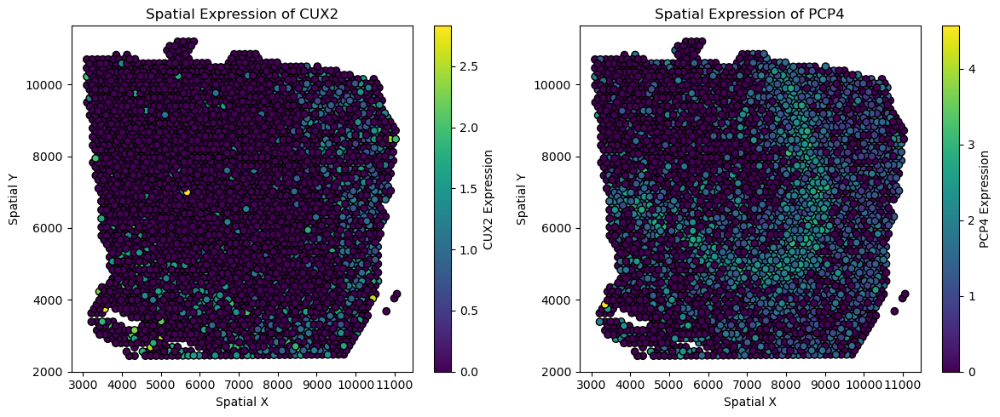

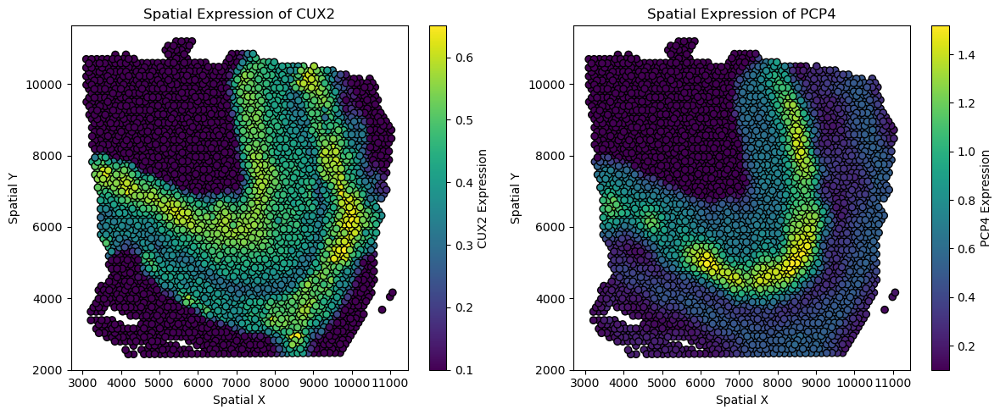

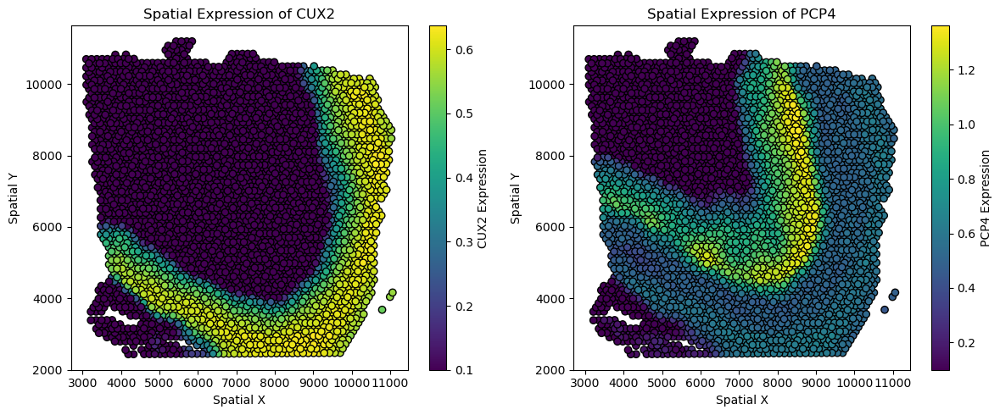

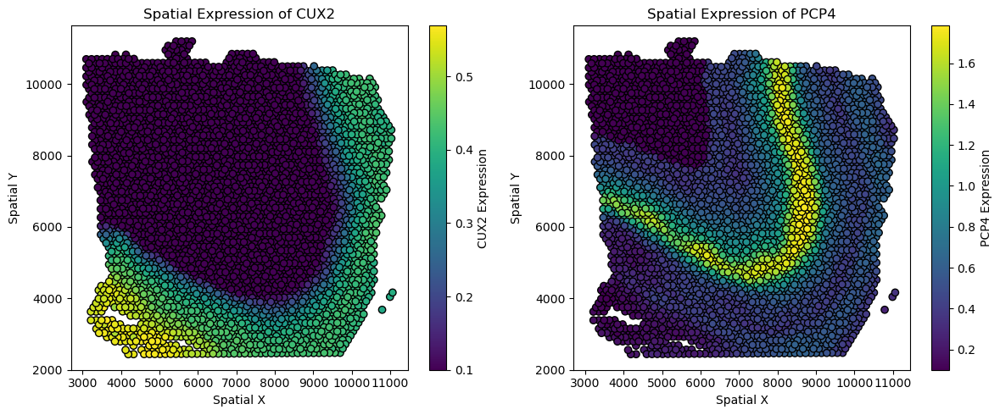

In [18]:
adata_clu = ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Real_STdata_filter.h5ad')

import matplotlib.pyplot as plt
import numpy as np
import scipy.sparse as sp
adata_clu1 = adata_clu[adata_clu.obs['batch_name_new'] == 1]
gene_names = ['CUX2',  'PCP4']  # 例如 ['GAPDH', 'ACTB', 'TP53']
# 确保基因存在
for gene in gene_names:
    if gene not in adata_clu1.var_names:
        raise ValueError(f"Gene {gene} not found in adata.var_names!")
# 获取空间坐标
spatial_coords = adata_clu1.obsm['spatial']

# 创建子图
fig, axes = plt.subplots(len(gene_names), 4, figsize=(6 * len(gene_names), 5))

for i, gene in enumerate(gene_names):
    ax = axes[i] if len(gene_names) > 1 else axes  # 兼容单基因情况
    if sp.issparse(adata_clu1[:, gene].X):
        gene_expression = adata_clu1[:, gene].X.toarray().flatten()
    else:
        gene_expression = adata_clu1[:, gene].X.flatten()
    scatter = ax.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=gene_expression, cmap='viridis', edgecolor='k' )
    recon_data=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce/full\pre_labels.h5ad')
    slice_1=recon_data.uns['x_recon_1']
    ax.set_title(f'Spatial Expression of {gene}')
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    fig.colorbar(scatter, ax=ax, label=f'{gene} Expression')
    
    

recon_data=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce/full\pre_labels.h5ad')
slice_1=recon_data.uns['x_recon_1']
fig, axes = plt.subplots(1, len(gene_names), figsize=(6 * len(gene_names), 5))
for i, gene in enumerate(gene_names):
    ax = axes[i] if len(gene_names) > 1 else axes  # 兼容单基因情况
    gene_expression = slice_1[gene].values.flatten()
    
    scatter = ax.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=gene_expression, cmap='viridis',edgecolor='k',vmin=0.1)
    ax.set_title(f'Spatial Expression of {gene}')
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    fig.colorbar(scatter, ax=ax, label=f'{gene} Expression')

plt.tight_layout()
plt.show()

recon_data=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1/2to2-silce-1\pre_labels.h5ad')
slice_1=recon_data.uns['x_recon_1']
fig, axes = plt.subplots(1, len(gene_names), figsize=(6 * len(gene_names), 5))
for i, gene in enumerate(gene_names):
    ax = axes[i] if len(gene_names) > 1 else axes  # 兼容单基因情况
    gene_expression = slice_1[gene].values.flatten()
    
    scatter = ax.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=gene_expression, cmap='viridis',edgecolor='k',vmin=0.1)
    ax.set_title(f'Spatial Expression of {gene}')
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    fig.colorbar(scatter, ax=ax, label=f'{gene} Expression')

plt.tight_layout()
plt.show()

recon_data=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Full1\pre_labels.h5ad')
slice_1=recon_data.uns['x_recon_1']
fig, axes = plt.subplots(1, len(gene_names), figsize=(6 * len(gene_names), 5))
for i, gene in enumerate(gene_names):
    ax = axes[i] if len(gene_names) > 1 else axes  # 兼容单基因情况
    gene_expression = slice_1[gene].values.flatten()
    
    scatter = ax.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=gene_expression, cmap='viridis',edgecolor='k',vmin=0.1)
    ax.set_title(f'Spatial Expression of {gene}')
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    fig.colorbar(scatter, ax=ax, label=f'{gene} Expression')

plt.tight_layout()
plt.show()

In [9]:
import statistics

from skimage.metrics import mean_squared_error
import scipy.stats as st
from scipy.spatial.distance import jensenshannon
from sklearn.metrics import mean_squared_error
import numpy as np

def ssim(im1,im2,M=1):
    im1, im2 = im1/im1.max(), im2/im2.max()
    mu1 = im1.mean()
    mu2 = im2.mean()
    sigma1 = np.sqrt(((im1 - mu1) ** 2).mean())
    sigma2 = np.sqrt(((im2 - mu2) ** 2).mean())
    sigma12 = ((im1 - mu1) * (im2 - mu2)).mean()
    k1, k2, L = 0.01, 0.03, M
    C1 = (k1*L) ** 2
    C2 = (k2*L) ** 2
    C3 = C2/2
    l12 = (2*mu1*mu2 + C1)/(mu1 ** 2 + mu2 ** 2 + C1)
    c12 = (2*sigma1*sigma2 + C2)/(sigma1 ** 2 + sigma2 ** 2 + C2)
    s12 = (sigma12 + C3)/(sigma1*sigma2 + C3)
    ssim = l12 * c12 * s12
    return ssim

def rmse(x1,x2):
    return mean_squared_error(x1,x2,squared=False)


def pcc(raw, impute):
    print("raw.shape:",raw.shape,"impute.shape:",impute.shape)
    if raw.shape[0] == impute.shape[0]:
        result=[]
        # result = pd.DataFrame()
        for label in raw.columns:
            if label not in impute.columns:
                pearsonr = 0
            else:
                raw_col = raw.loc[:, label]
                impute_col = impute.loc[:, label]
                impute_col = impute_col.fillna(1e-20)
                raw_col = raw_col.fillna(1e-20)
                pearsonr, _ = st.pearsonr(raw_col, impute_col)
                # pearman’s rank correlation coefficien
            # pcc_df = pd.DataFrame(pearsonr, index=["PCC"], columns=[label])
            # result = pd.concat([result, pcc_df], axis=1)
            result.append(pearsonr)
    else:
        print("columns error")
    return result


def js(x1,x2):
    return jensenshannon(x1,x2)

def calculate_rank_as(scores):
    sorted_indices = np.argsort(scores)  # Indices that would sort the array
    rank = np.empty_like(scores)
    rank[sorted_indices] = np.arange(len(scores))
    return rank
def kl_divergence(P, Q):
    """
    计算 KL 散度，忽略 P 和 Q 中值为 0 的部分。
    :param P: 第一个概率分布 (1D array or Series)
    :param Q: 第二个概率分布 (1D array or Series)
    :return: KL 散度
    """
    P = np.array(P)
    Q = np.array(Q)

    # 避免除零和 log(0)，添加非常小的值到 Q
    epsilon = 1e-10
    Q = Q + epsilon

    # 仅保留 P > 0 的部分
    mask = P > 0
    return np.sum(P[mask] * np.log(P[mask] / Q[mask]))

def calculate_rank_de(scores):
    sorted_indices = np.argsort(scores)[::-1]  # Reverse the sorted order for descending ranks
    ranks = np.empty_like(scores)
    ranks[sorted_indices] = np.arange(len(scores))
    return ranks


In [40]:

import pandas as pd
import anndata as ad

# 你自己的模型结果
resultdata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Domain\pre_labels.h5ad')
df=resultdata.uns['domain_result']
result_df= df[df.index.str.endswith("_3")]
result_df_binary = (result_df.eq(result_df.max(axis=1), axis=0)).astype(int)
stadata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\st3.h5ad')
true_labels = stadata.obs['layer']
true_labels_onehot = pd.get_dummies(true_labels).astype(int)
# 重新排列列顺序与 result_df 相同（防止顺序不一致）
true_labels_onehot = true_labels_onehot[result_df.columns]
true_labels_onehot = true_labels_onehot.loc[result_df_binary.index]

a=rmse(true_labels_onehot, result_df_binary)
print("rmse:",a)
b=js(true_labels_onehot, result_df_binary)
A = [x for x in b if not np.isnan(x)]
print(f"js:{np.mean(A):.4f}")
c=pcc(true_labels_onehot, result_df_binary)
A = [x for x in c if not np.isnan(x)]
print(f"pcc:{np.mean(A):.4f}")
d=ssim(true_labels_onehot, result_df_binary)
A = [x for x in d if not np.isnan(x)]
print(f"ssim:{np.mean(A):.4f}")


AnnData object with n_obs × n_vars = 3611 × 3281
    obs: 'in_tissue', 'array_row', 'array_col', 'batch_name', 'barcode', 'slice_id', 'layer', 'batch_name_new', 'Istrue', 'n_genes', 'guess_layer'
    obsm: 'dist_adj', 'spatial'
    layers: 'norm'

In [13]:
import pandas as pd
import anndata as ad

# 你自己的模型结果
# resultdata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Domain\pre_labels.h5ad')
resultdata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Domain\pre_labels_st2.h5ad')
df=resultdata.uns['domain_result']
result_df= df[df.index.str.endswith("_4")]
guess_layer = result_df.idxmax(axis=1)

stadata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\st4.h5ad')
stadata.obs['guess_layer']=guess_layer
stadata

Accuracy: 0.7892742640629554


In [2]:
import ot
def refine_label(adata, radius=30, key='label'):
    n_neigh = radius
    new_type = []
    old_type = adata.obs[key].values

    # calculate distance
    position = adata.obsm['spatial']
    distance = ot.dist(position, position, metric='euclidean')

    n_cell = distance.shape[0]

    for i in range(n_cell):
        if old_type[i] == 'L4':  # 保留 L4 不变
            new_type.append('L4')
        else:
            vec = distance[i, :]
            index = vec.argsort()
            neigh_type = []
            for j in range(1, n_neigh + 1):
                neigh_type.append(old_type[index[j]])
            max_type = max(neigh_type, key=neigh_type.count)
            new_type.append(max_type)

    new_type = [str(i) for i in list(new_type)]
    adata.obs['label_refined'] = np.array(new_type)
    return adata

data=refine_label(stadata,15,'guess_layer')
data

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "D:\Anaconda3\envs\Spoint\lib\site-packages\IPython\core\interactiveshell.py", line 3550, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\DELL\AppData\Local\Temp\ipykernel_9052\1263496787.py", line 29, in <module>
    data=refine_label(stadata,15,'guess_layer')
  File "C:\Users\DELL\AppData\Local\Temp\ipykernel_9052\1263496787.py", line 26, in refine_label
    adata.obs['label_refined'] = np.array(new_type)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\Anaconda3\envs\Spoint\lib\site-packages\IPython\core\interactiveshell.py", line 2144, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
  File "D:\Anaconda3\envs\Spoint\lib\site-packages\IPython\core\ultratb.py", line 1435, in structured_traceback
    return FormattedTB.structured_traceback(
  File "D:\Anaconda3\envs\Spoint\lib\site-package

D:\Anaconda3\envs\Spoint\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
D:\Anaconda3\envs\Spoint\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


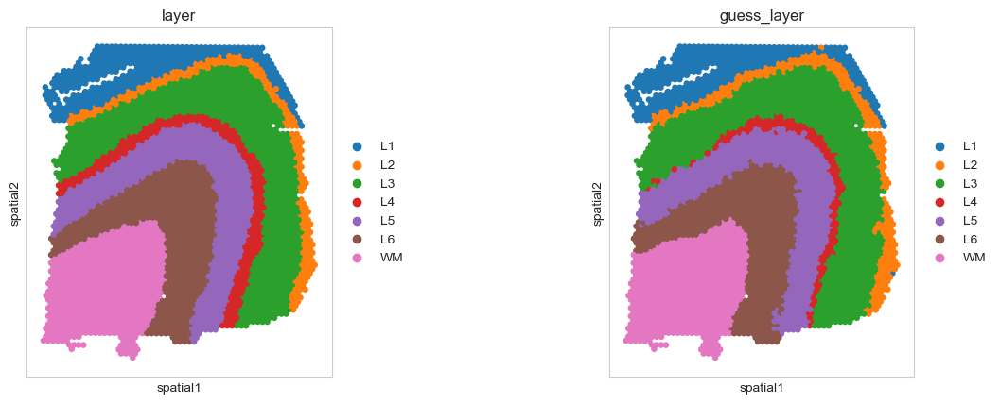

In [6]:
import scanpy as sc
import matplotlib.pyplot as plt

# 绘图（show=True 也可以保留，或者设为 False）
sc.pl.spatial(
    data, 
    color=['layer', 'guess_layer', 'label_refined'],
    spot_size=180,
    show=False   # 先不显示，让我们可以先保存
)

# 保存图像
plt.savefig("D:/pythonplaces/deconv-mulST/img/Dataset1/domain_st4.pdf", format="pdf", bbox_inches="tight", dpi=300)



In [10]:

result_df_binary

Accuracy: 0.9182943603851444


In [4]:
stadata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\st1.h5ad')
true_labels = stadata.obs['layer']
true_labels

AAACAAGTATCTCCCA-1_1    L3
AAACAATCTACTAGCA-1_1    L1
AAACACCAATAACTGC-1_1    WM
AAACAGAGCGACTCCT-1_1    L3
AAACAGCTTTCAGAAG-1_1    L5
                        ..
TTGTTTCACATCCAGG-1_1    WM
TTGTTTCATTAGTCTA-1_1    WM
TTGTTTCCATACAACT-1_1    L6
TTGTTTGTATTACACG-1_1    WM
TTGTTTGTGTAAATTC-1_1    L2
Name: layer, Length: 3611, dtype: category
Categories (7, object): ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']

In [7]:
# 确保列顺序和 result_df 一致
true_labels_onehot = pd.get_dummies(true_labels).astype(int)

# 重新排列列顺序与 result_df 相同（防止顺序不一致）
true_labels_onehot = true_labels_onehot[result_df.columns]
true_labels_onehot

,L1,L2,L3,L4,L5,L6,WM
AAACAAGTATCTCCCA-1_1,0,0,1,0,0,0,0
AAACAATCTACTAGCA-1_1,1,0,0,0,0,0,0
AAACACCAATAACTGC-1_1,0,0,0,0,0,0,1
AAACAGAGCGACTCCT-1_1,0,0,1,0,0,0,0
AAACAGCTTTCAGAAG-1_1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1_1,0,0,0,0,0,0,1
TTGTTTCATTAGTCTA-1_1,0,0,0,0,0,0,1
TTGTTTCCATACAACT-1_1,0,0,0,0,0,1,0
TTGTTTGTATTACACG-1_1,0,0,0,0,0,0,1


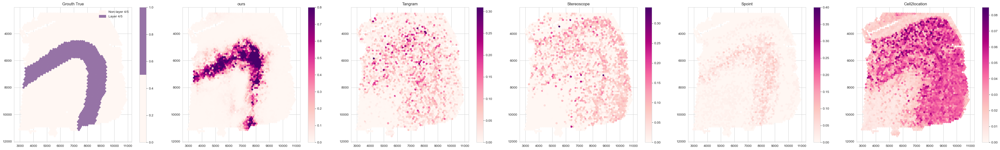

In [33]:
# 对齐索引，确保两个 DataFrame 顺序完全一致
true_labels_onehot = true_labels_onehot.loc[result_df_binary.index]
true_labels_onehot

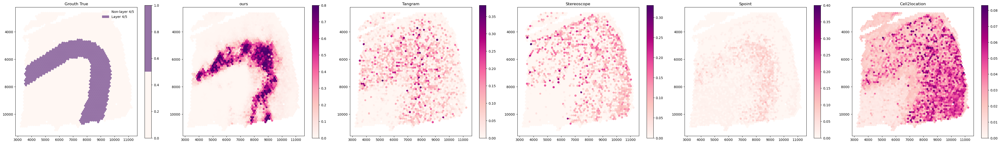

In [93]:

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Create 2x5 layout for plotting
fig, axes = plt.subplots(1, 6, figsize=(42, 6))
import matplotlib.patches as mpatches
# List of results (example paths; replace with actual paths)
composition_data_files = [
    "D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\st4.h5ad",
    'D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce/full\pre_labels.h5ad',
    'D:\pythonplaces\deconv-mulST\Baseline\Tangram\Result\Dataset1\Tangram_result.csv',
    'D:\pythonplaces\deconv-mulST\Baseline\Stereoscope\Result\Dataset1\Stereoscope_result.csv',
    'D:\pythonplaces\deconv-mulST\Baseline\Spoint\Result\Dataset1\proportion.csv',
    'D:\pythonplaces\deconv-mulST\Baseline\Cell2location\Result\Dataset1\Cell2location_result2.csv'
]
titles = [ 'Grouth True','ours', 'Tangram', 'Stereoscope', 'Spoint','Cell2location']
binary_cmap = ListedColormap(['#FFF7F3', '#9673A6'])
for i, file_path in enumerate(composition_data_files):
    # Load the result for the ith method 
    if i==0:
        stadata = sc.read_h5ad(file_path)
        celltype_expression=stadata.obs['layer'].isin(['L5', 'L4']).astype(int)
        spatial_coords = stadata.obsm['spatial']
    elif i==1:
        result_df = ad.read_h5ad(file_path)
        df=resultdata.uns['deconv_result']
        result_df= df[df.index.str.endswith("_4")]
        celltype_expression = result_df['Ex_3_L4_5'].values
    else:
        result = pd.read_csv(file_path, index_col=0)
        result_filter = result[result.index.str.endswith("_4")]
        celltype_expression= result_filter['Ex_3_L4_5'].values
    # Plot for the corresponding method
    ax = axes[i]
    if i==0:
        scatter = ax.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=celltype_expression,
                         cmap=binary_cmap, s=30, vmin=0, vmax=1)
        legend_handles = [
        mpatches.Patch(color='#FFF7F3', label='Non-layer 4/5'),
        mpatches.Patch(color='#9673A6', label='Layer 4/5')
    ]
        ax.legend(handles=legend_handles, loc='upper right', frameon=False, fontsize=10)
    elif i==1:  
        scatter = ax.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=celltype_expression,
                         cmap='RdPu', s=30, vmin=0,vmax=0.8)
    elif i==4:  
        scatter = ax.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=celltype_expression,
                         cmap='RdPu', s=30, vmin=0,vmax=0.4)
    else:  
        scatter = ax.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=celltype_expression,
                         cmap='RdPu', s=30, vmin=0)
   
    ax.set_title(titles[i])
  
    fig.colorbar(scatter, ax=ax, orientation='vertical')
    ax.set_aspect('equal')       # 保持正方形比例
    ax.invert_yaxis()    
    
# Adjust layout and display the plot
plt.tight_layout()
plt.savefig("D:\pythonplaces\deconv-mulST\img\Dataset1/result_st4.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [5]:
import scanpy as sc
recon_data = sc.read_h5ad(r'D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Full1\pre_labels.h5ad')
recon_data.obs['batch_name_new']

array([1, 2, 3, 4, 0], dtype=int64)

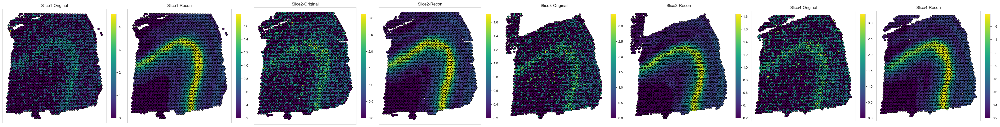

In [6]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.sparse as sp

# 读取原始数据
adata_clu = sc.read_h5ad(r'D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Real_STdata_filter.h5ad')
adata_clu1 = adata_clu[adata_clu.obs['batch_name_new'] == 1]
adata_clu2 = adata_clu[adata_clu.obs['batch_name_new'] == 2]
adata_clu3 = adata_clu[adata_clu.obs['batch_name_new'] == 3]
adata_clu4 = adata_clu[adata_clu.obs['batch_name_new'] == 4]

# 基因和空间坐标
#PCP4,CUX2,['ST18' 'PLP1' 'MOBP' 'SLC44A1' 'PIP4K2A' 'CTNNA3' 'TMEM144' 'RNF220' 'TF''MBP']
gene = ['PCP4']
spatial_coords = [adata_clu1.obsm['spatial'],
                  adata_clu1.obsm['spatial'],
                  adata_clu2.obsm['spatial'],
                  adata_clu2.obsm['spatial'],
                  adata_clu3.obsm['spatial'],
                  adata_clu3.obsm['spatial'],
                  adata_clu4.obsm['spatial'],
                  adata_clu4.obsm['spatial']]

# 读取重构数据
recon_data = sc.read_h5ad(r'D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Full1\pre_labels.h5ad')
slice_1 = recon_data.uns['x_recon_1']
slice_2 = recon_data.uns['x_recon_2']
slice_3 = recon_data.uns['x_recon_3']
slice_4 = recon_data.uns['x_recon_4']

datas = [adata_clu1, slice_1, adata_clu2, slice_2, adata_clu3, slice_3, adata_clu4, slice_4]
titles = ['Slice1-Original', 'Slice1-Recon', 
          'Slice2-Original', 'Slice2-Recon', 
          'Slice3-Original', 'Slice3-Recon', 
          'Slice4-Original', 'Slice4-Recon']

# 创建图
fig, axes = plt.subplots(1, 8, figsize=(40, 5))

for i, data in enumerate(datas):
    ax = axes[i]
    coords = spatial_coords[i]

    if i%2==0:
        if sp.issparse(adata_clu1[:, gene].X):
            gene_expression = data[:, gene].X.toarray().flatten()
        else:
            gene_expression = data[:, gene].X.flatten()
    else:  # 假设是 numpy ndarray 或 DataFrame
        gene_expression=data[gene].values.flatten()

    # 绘图
    if i%2==0:
        scatter = ax.scatter(coords[:, 0], coords[:, 1],c=gene_expression, cmap='viridis', edgecolor='k', s=30)
    else:
        scatter = ax.scatter(coords[:, 0], coords[:, 1],c=gene_expression, cmap='viridis', edgecolor='k', s=30,vmin=0.2)
    ax.set_title(titles[i])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    ax.invert_yaxis()
    fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig(r'D:\pythonplaces\deconv-mulST\img\Dataset1\PCP4_expression_compare.pdf', format="pdf", bbox_inches="tight")
plt.show()


In [6]:
filtered_data = recon_data[recon_data.obs['batch_name_new'] != 0].copy()
filtered_data

AnnData object with n_obs × n_vars = 14243 × 3281
    obs: 'batch_name_new', 'Istrue', 'domain'
    uns: 'deconv_result', 'pca', 'x_recon_1', 'x_recon_2', 'x_recon_3', 'x_recon_4'
    obsm: 'X_pca', 'dist_adj', 'exp_adj', 'latent', 'latent_no_batch'
    varm: 'PCs'

In [31]:
Real_st=sc.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Real_STdata_filter.h5ad')
Real_st

AnnData object with n_obs × n_vars = 14243 × 3281
    obs: 'in_tissue', 'array_row', 'array_col', 'batch_name', 'barcode', 'slice_id', 'layer', 'batch_name_new', 'Istrue', 'n_genes'
    obsm: 'dist_adj', 'spatial'
    layers: 'norm'

In [103]:
import anndata as ad
our_data=ad.read_h5ad("D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Domain\pre_labels.h5ad")
our_data

AnnData object with n_obs × n_vars = 14243 × 3281
    obs: 'in_tissue', 'array_row', 'array_col', 'batch_name', 'barcode', 'slice_id', 'layer', 'batch_name_new', 'Istrue', 'n_genes', 'domain'
    uns: 'domain_result', 'pca', 'x_recon_1', 'x_recon_2', 'x_recon_3', 'x_recon_4'
    obsm: 'X_pca', 'dist_adj', 'exp_adj', 'latent', 'latent_no_batch', 'spatial'
    varm: 'PCs'
    layers: 'norm'

In [104]:
our_data1=our_data[our_data.obs['batch_name_new'] != 0].copy()
our_data1

AnnData object with n_obs × n_vars = 14243 × 3281
    obs: 'in_tissue', 'array_row', 'array_col', 'batch_name', 'barcode', 'slice_id', 'layer', 'batch_name_new', 'Istrue', 'n_genes', 'domain'
    uns: 'domain_result', 'pca', 'x_recon_1', 'x_recon_2', 'x_recon_3', 'x_recon_4'
    obsm: 'X_pca', 'dist_adj', 'exp_adj', 'latent', 'latent_no_batch', 'spatial'
    varm: 'PCs'
    layers: 'norm'

In [107]:
import harmonypy as hm
ILISI = hm.compute_lisi(filtered_data.obsm['latent_no_batch'], filtered_data.obs[['batch_name_new']], label_colnames=['batch_name_new'])[:, 0]
CLISI = hm.compute_lisi(filtered_data.obsm['latent_no_batch'], filtered_data.obs[['domain']], label_colnames=['domain'])[:, 0]
def calculate_F1LISI(LISI_domain_norm, LISI_batch_norm):
    LISI = 2 * (1 / LISI_domain_norm) * LISI_batch_norm / (1 / LISI_domain_norm + LISI_batch_norm)
    return LISI
F1LISI_ours = calculate_F1LISI( CLISI, ILISI)
F1LISI_ours

array([1.54787575, 1.33608964, 1.15483415, ..., 1.11327718, 1.46996803,
       1.24952438])

In [43]:
ILISI = hm.compute_lisi(filtered_data.obsm['latent_no_batch'], filtered_data.obs[['batch_name_new']], label_colnames=['batch_name_new'])[:, 0]
CLISI = hm.compute_lisi(filtered_data.obsm['latent_no_batch'], Real_st.obs[['layer']], label_colnames=['layer'])[:, 0]
def calculate_F1LISI(LISI_domain_norm, LISI_batch_norm):
    LISI = 2 * (1 / LISI_domain_norm) * LISI_batch_norm / (1 / LISI_domain_norm + LISI_batch_norm)
    return LISI
F1LISI_ours1 = calculate_F1LISI( CLISI, ILISI)
F1LISI_ours1

array([1.54787575, 1.33392203, 1.15483415, ..., 1.11327718, 1.02863106,
       0.81098409])

In [11]:
SEDR_data=sc.read_h5ad("D:\pythonplaces\SEDR\Result\DLPFC/SEDR_H_sample2.h5ad")
ILISI = hm.compute_lisi(SEDR_data.obsm['SEDR.Harmony'], SEDR_data.obs[['proj_name']], label_colnames=['proj_name'])[:, 0]
CLISI = hm.compute_lisi(SEDR_data.obsm['SEDR.Harmony'], SEDR_data.obs[['layer_guess']], label_colnames=['layer_guess'])[:, 0]
F1LISI_SEDR = calculate_F1LISI( CLISI, ILISI)
F1LISI_SEDR

array([1.39410252, 0.83476323, 1.45728093, ..., 1.40454422, 1.04209099,
       0.79320078])

In [32]:

STAligner_data=sc.read_h5ad('D:\pythonplaces\STAligner-master\Result\DLPFC\STAligner_result.h5ad')
ILISI = hm.compute_lisi(STAligner_data.obsm['STAligner'], STAligner_data.obs[['batch_name']], label_colnames=['batch_name'])[:, 0]
CLISI = hm.compute_lisi(STAligner_data.obsm['STAligner'], STAligner_data.obs[['Ground Truth']], label_colnames=['Ground Truth'])[:, 0]
F1LISI_STAligner = calculate_F1LISI( CLISI, ILISI)
F1LISI_STAligner

array([1.44125925, 1.29340414, 1.2842019 , ..., 1.30666467, 1.10125396,
       1.28887938])

In [38]:
Stich3D_data=sc.read_h5ad('D:\pythonplaces\STitch3D-main/results_DLPFC_4/all_adata.h5ad')
ILISI = hm.compute_lisi(Stich3D_data.obsm['latent'], Stich3D_data.obs[['batch_name']], label_colnames=['batch_name'])[:, 0]
CLISI = hm.compute_lisi(Stich3D_data.obsm['latent'], Stich3D_data.obs[['layer']], label_colnames=['layer'])[:, 0]
F1LISI_Stich3D = calculate_F1LISI( CLISI, ILISI)
F1LISI_Stich3D

array([1.43966887, 1.12271738, 1.14984267, ..., 1.54133777, 1.37206464,
       0.8569302 ])

In [70]:
SPACEL_data=sc.read_h5ad('D:\pythonplaces\SPACEL-main\SPACEL\Splane\Result\DLPFC\DLPFC_st.h5ad')
ILISI = hm.compute_lisi(SPACEL_data.X, SPACEL_data.obs[['batch_name']], label_colnames=['batch_name'])[:, 0]
CLISI = hm.compute_lisi(SPACEL_data.X, SPACEL_data.obs[['layer']], label_colnames=['layer'])[:, 0]
F1LISI_SPACEL = calculate_F1LISI( CLISI, ILISI)
F1LISI_SPACEL

D:\Anaconda3\envs\MACD\lib\site-packages\sklearn\neighbors\_base.py:583: UserWarning: cannot use tree with sparse input: using brute force
  warnings.warn("cannot use tree with sparse input: using brute force")
D:\Anaconda3\envs\MACD\lib\site-packages\sklearn\neighbors\_base.py:583: UserWarning: cannot use tree with sparse input: using brute force
  warnings.warn("cannot use tree with sparse input: using brute force")


array([0.92441947, 0.8397783 , 1.24010853, ..., 1.08655879, 0.8899472 ,
       0.89277821])

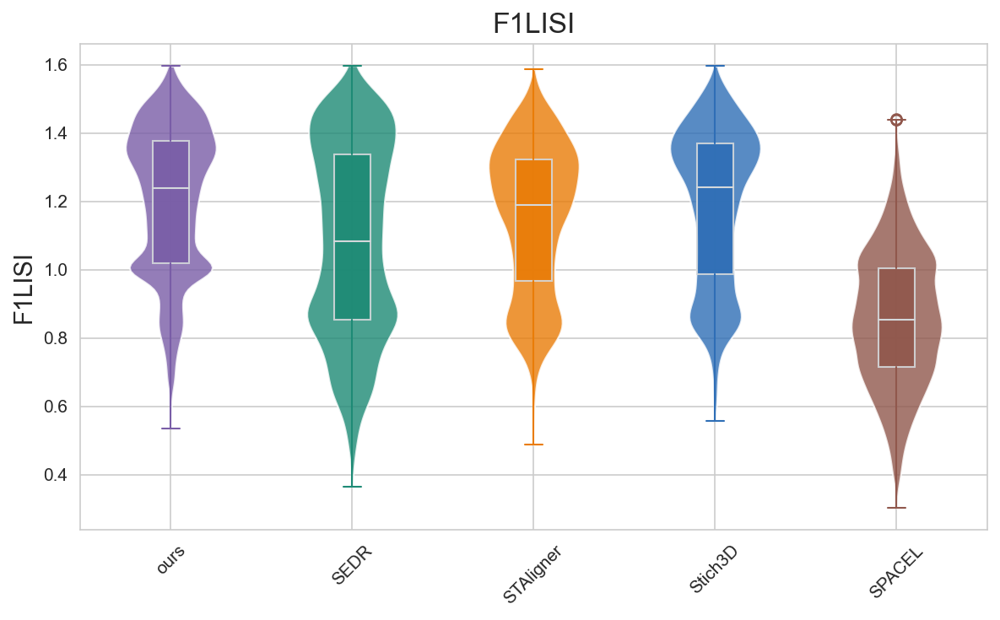

In [108]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 示例自定义颜色列表，确保它与你的实际需求匹配
custom_colors = [
    "#795DA7", "#1D8A75", "#E97C07", "#2E6EB6","#90574C"]

# 假设 remove_outliers 函数已定义
def remove_outliers(data, threshold=1.5):
    """简单的异常值去除，假设使用 IQR 方法"""
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return data[(data >= lower_bound) & (data <= upper_bound)]

# 绘制图表的通用函数
def plot_composite_box_violin(data, filename, title, ylabel="RMSE"):
    # 将数据从宽格式转换为长格式，方便绘图
    rmse_df = pd.DataFrame(data)
    rmse_long = rmse_df.melt(var_name="Method", value_name=ylabel)

    # 创建绘图区域
    fig, ax = plt.subplots(figsize=(8, 5), dpi=150)

    # 获取数据的方法名和对应的RMSE值
    categories = rmse_df.columns.tolist()

    # 绘制每个类别的小提琴图和箱型图
    y_offset = 0.0  # 小提琴图相对于箱型图的右移距离

    for i, category in enumerate(categories):
        subset = rmse_df[category].values
        if i == 0 or i==4:
            cleaned_subset = remove_outliers(subset) 
        else:
            cleaned_subset = subset
        # 清理异常值（如果需要）

        # 绘制小提琴图
        parts = ax.violinplot(
            cleaned_subset,
            positions=[i + y_offset],
            showmeans=False,
            showmedians=False,
            showextrema=False
        )

        # 设置小提琴图的颜色
        for pc in parts["bodies"]:
            pc.set_facecolor(custom_colors[i])
            pc.set_alpha(0.8)  # 设置透明度

        # 添加散点图，增加扰动避免重叠
        # jitter = np.random.normal(0, 0.04, size=cleaned_subset.shape)
        # ax.scatter(np.full(cleaned_subset.shape, i + y_offset) + jitter, cleaned_subset,
        #            color=custom_colors[i], edgecolor="#888888", s=5)

        # 绘制箱型图
        ax.boxplot(cleaned_subset, positions=[i], widths=0.2, patch_artist=True,
                   boxprops=dict(facecolor=custom_colors[i], color="#D4D8DB", alpha=0.9),
                   capprops=dict(color=custom_colors[i]),
                   whiskerprops=dict(color=custom_colors[i]),
                   flierprops=dict(markeredgecolor=custom_colors[i]),
                   medianprops=dict(color="#D4D8DB"))

    # 设置x轴标签和标题
    ax.set_xticks(range(len(categories)))
    ax.set_xticklabels(categories, rotation=45)
    ax.set_title(title, fontsize=16)

    # 设置y轴标签
    ax.set_ylabel(ylabel, fontsize=14)
    plt.subplots_adjust(wspace=0.2)  # 调整子图之间的水平间距

    # 优化布局
    plt.tight_layout()
    plt.savefig(filename, format='pdf')
    plt.show()

datasets = {
    'F1LISI': {
        'ours': F1LISI_ours, 'SEDR': F1LISI_SEDR, 'STAligner': F1LISI_STAligner, 'Stich3D': F1LISI_Stich3D,'SPACEL':F1LISI_SPACEL,
    }
    
}
for metric, data in datasets.items():
    filename = f'{metric}.pdf'  # 根据指标生成文件名
    title = f"{metric}"  # 标题根据指标动态变化
    plot_composite_box_violin(data, filename, title, ylabel=metric)

C:\Users\DELL\AppData\Local\Temp\ipykernel_28652\1315370166.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added_pred] = cluster_labels
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be chan

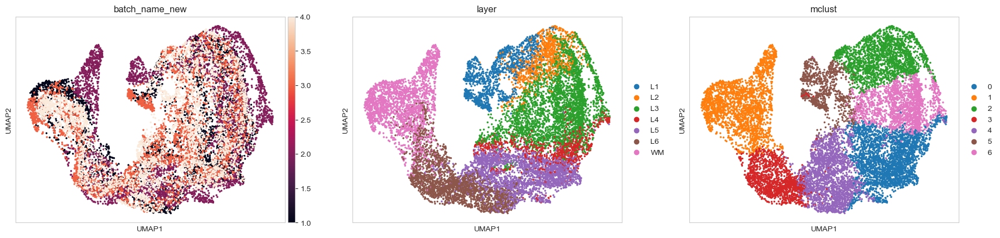

<Figure size 640x480 with 0 Axes>

In [16]:
import anndata as ad
alldata=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce/full\pre_labels.h5ad')
sub_adata_tmp = alldata[alldata.obs['batch_name_new'] != 0]
from sklearn.cluster import KMeans
def Kmeans_cluster(adata, num_cluster, used='latent', key_added_pred="G3STNET", random_seed=2024):
    np.random.seed(random_seed)
    cluster_model = KMeans(n_clusters=num_cluster, init='k-means++', n_init=100, max_iter=1000, tol=1e-6)
    cluster_labels = cluster_model.fit_predict(adata.obsm[used])
    adata.obs[key_added_pred] = cluster_labels
    adata.obs[key_added_pred] = adata.obs[key_added_pred].astype('int')
    adata.obs[key_added_pred] = adata.obs[key_added_pred].astype('category')
    return adata
adata_clu = Kmeans_cluster(sub_adata_tmp, num_cluster=7, used='latent_no_batch', key_added_pred='mclust', random_seed=42)
sub_adata_tmp=adata_clu
data_true=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset1\All-silce\Real_STdata_filter.h5ad')
import scanpy as sc
sub_adata_tmp.obsm['spatial']=data_true.obsm['spatial']
sub_adata_tmp.obs['layer']=data_true.obs['layer']
sc.pp.neighbors(sub_adata_tmp, use_rep='latent_no_batch', metric='cosine')
sc.tl.umap(sub_adata_tmp)
sc.pl.umap(sub_adata_tmp, color=['batch_name_new','layer','domain','mclust'], show=True, size=25, save=False)


In [18]:
sub_adata_tmp.uns['latent_no_batch']

D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
D:\Anaconda3\envs\MACD\lib\site-packages\scanpy\plot

[<Axes: title={'center': 'batch_name_new'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'layer'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'mclust'}, xlabel='UMAP1', ylabel='UMAP2'>]

In [29]:
sub_adata_tmp.obs['batch_name_new'] = sub_adata_tmp.obs['batch_name_new'].astype(str)

custom_colors = {
    '1': '#1f77b4',  # 蓝色
    '2': '#ff7f0e',  # 橙色
    '3': '#2ca02c',  # 绿色
    '4': '#C0292A', 
}

sc.pl.umap(
    sub_adata_tmp, 
    color='batch_name_new', 
    palette=custom_colors,
    title='UMAP by batch',
    show=True
)

In [1]:
import harmonypy as hm
import anndata as ad
def calculate_F1LISI(LISI_domain_norm, LISI_batch_norm):
    LISI = 2 * (1 / LISI_domain_norm) * LISI_batch_norm / (1 / LISI_domain_norm + LISI_batch_norm)
    return LISI
True_region=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset4\Real_STdata_filter_region.h5ad')

data=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset4\domain_45_3\pre_batch.h5ad')
ILISI = hm.compute_lisi(data.obsm['latent_no_batch'], data.obs[['batch_name_new']], label_colnames=['batch_name_new'])[:, 0]
CLISI = hm.compute_lisi(data.obsm['latent_no_batch'], True_region.obs[['region_to_category_1']], label_colnames=['region_to_category_1'])[:, 0]
F1LISI_ours = calculate_F1LISI( CLISI, ILISI)

data1=ad.read_h5ad('D:\pythonplaces\deconv-mulST\Result\Dataset4\domain_over_45_3\pre_batch_over.h5ad')
ILISI = hm.compute_lisi(data1.obsm['latent_no_batch'], data1.obs[['batch_name_new']], label_colnames=['batch_name_new'])[:, 0]
CLISI = hm.compute_lisi(data1.obsm['latent_no_batch'], True_region.obs[['region_to_category_1']], label_colnames=['region_to_category_1'])[:, 0]
F1LISI_ours1 = calculate_F1LISI( CLISI, ILISI)

SEDR_data=ad.read_h5ad("D:\pythonplaces\SEDR\Result\dataset4\SEDR_H_sample2_1.h5ad")
ILISI = hm.compute_lisi(SEDR_data.obsm['SEDR.Harmony'], SEDR_data.obs[['batch_name_new']], label_colnames=['batch_name_new'])[:, 0]
CLISI = hm.compute_lisi(SEDR_data.obsm['SEDR.Harmony'], True_region.obs[['region_to_category_1']], label_colnames=['region_to_category_1'])[:, 0]
F1LISI_SEDR = calculate_F1LISI( CLISI, ILISI)

STAligner_data=ad.read_h5ad('D:\pythonplaces\STAligner-master\Result\dataset4\STAligner_result1.h5ad')
ILISI = hm.compute_lisi(STAligner_data.obsm['STAligner'], STAligner_data.obs[['batch_name_new']], label_colnames=['batch_name_new'])[:, 0]
CLISI = hm.compute_lisi(STAligner_data.obsm['STAligner'], True_region.obs[['region_to_category_1']], label_colnames=['region_to_category_1'])[:, 0]
F1LISI_STAligner = calculate_F1LISI( CLISI, ILISI)

Stich3D_data=ad.read_h5ad('D:\pythonplaces\STitch3D-main\dataset4/result_st_1.h5ad')
ILISI = hm.compute_lisi(Stich3D_data.obsm['latent'], Stich3D_data.obs[['batch_name_new']], label_colnames=['batch_name_new'])[:, 0]
CLISI = hm.compute_lisi(Stich3D_data.obsm['latent'], True_region.obs[['region_to_category_1']], label_colnames=['region_to_category_1'])[:, 0]
F1LISI_Stich3D = calculate_F1LISI( CLISI, ILISI)

SPACEL_data=ad.read_h5ad('D:\pythonplaces\SPACEL-main\SPACEL\Splane\Result\dataset4\dataset4_cluster.h5ad')
ILISI = hm.compute_lisi(SPACEL_data.X, SPACEL_data.obs[['batch_name_new']], label_colnames=['batch_name_new'])[:, 0]
CLISI = hm.compute_lisi(SPACEL_data.X, True_region.obs[['region_to_category_1']], label_colnames=['region_to_category_1'])[:, 0]
F1LISI_SPACEL = calculate_F1LISI( CLISI, ILISI)

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "D:\Anaconda3\envs\Spoint\lib\site-packages\IPython\core\interactiveshell.py", line 3550, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\DELL\AppData\Local\Temp\ipykernel_14140\2186732678.py", line 1, in <module>
    import harmonypy as hm
ModuleNotFoundError: No module named 'harmonypy'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\Anaconda3\envs\Spoint\lib\site-packages\IPython\core\interactiveshell.py", line 2144, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
  File "D:\Anaconda3\envs\Spoint\lib\site-packages\IPython\core\ultratb.py", line 1435, in structured_traceback
    return FormattedTB.structured_traceback(
  File "D:\Anaconda3\envs\Spoint\lib\site-packages\IPython\core\ultratb.py", line 1326, in structured_traceback
    return VerboseTB.structured_traceback(
  File "D:\Anaconda3\envs\Spoint\lib\site-packages\